In [1]:
import numpy as np
from pathlib import Path
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from matplotlib import cm
from scipy.interpolate import RegularGridInterpolator
from scipy import sparse
from scipy.sparse.linalg import spsolve
from trainer import *
from models import *
from utils import *

def normal1(x, y, h, mean=[0, 0]):
    var = np.diag([1] * 2) * h**2 / (2 * np.pi)
    pos = np.dstack((x, y))
    rv = multivariate_normal(mean, var)
    return rv.pdf(pos)

In [ ]:
def draw(valu_path, names, data_path='./data/2knormal259/', order=2, N=259, surf=False, bc=False):
    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    if not bc:
        xx = xx[1:-1, 1:-1]
        yy = yy[1:-1, 1:-1]
    h = 2/(N-1)
    
    A = sparse.load_npz(data_path + 'A.npz').tocsr()
    valB = np.load(data_path + 'ValB.npy')
    paths = list(x for x in Path(valu_path).iterdir() if x.is_dir())
    
    i, j = 0, len(paths)-1
    while i <= j:
        for name in names:
            if not name in paths[i].name:
                paths.pop(i)
                i -= 1
                j -= 1
                break
        i += 1

    for p in paths[:]:
        pres = list(p.glob('*.npy'))
        n = len(pres)
        if n==0:
            continue
        fig = plt.figure()
        fig.set_figheight(16)
        fig.set_figwidth(40)
        if not surf:
            for i in range(n):
                pre = np.load(pres[i])
                ans = np.float32(spsolve(A, valB[i,:]).reshape(pre.shape))
                diff = ((pre - ans)**2)
                ax = fig.add_subplot(2, 5, i+1)
                ax.set_title(f'$L2 Norm:{(diff*h**2).sum():.4f}$', fontsize=20)
                im = ax.imshow(diff/ans, cmap='jet')
                plt.colorbar(im, shrink=0.8)
            fig.suptitle(p.name, fontsize=32)
            fig.tight_layout()
        else:
            for i in range(n):
                pre = np.load(pres[i])
                ax = fig.add_subplot(2, 5, i+1, projection='3d')
                surf_pre = ax.plot_surface(xx, yy, pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
                plt.colorbar(surf_pre, shrink=0.8)
            fig.suptitle(p.name, fontsize=32)
            fig.tight_layout()
            
        
draw('./valu/', data_path='./data/normal65/',names=['UNet'], order=2, N=65, surf=False, bc=False)

In [ ]:
def test(model, ckpt_path, data_path, order=2, N=131, mode='F'):
    A = sparse.load_npz(data_path + 'A.npz').tocsr()
    valB = np.load(data_path + 'ValB.npy')
    h = 2/(N-1)
    ckpt = torch.load(ckpt_path)
    model.load_state_dict(ckpt['state_dict'])
    model.freeze()

    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    xx = xx[1:-1, 1:-1]
    yy = yy[1:-1, 1:-1]
    
    if mode == 'F':
        data = np.load(data_path + 'ValF.npy')
        num = data.shape[0]
        Qs = np.linspace(5000, 10000, num)
        
    elif mode == 'M':
        data = np.load(data_path + 'ValM.npy')
        num = data.shape[0]
        Qs = np.linspace(5000, 10000, num)
        
    for i in range(num):
        fig = plt.figure()
        fig.set_figheight(10)
        fig.set_figwidth(30)

        tensor = torch.from_numpy(data[i][np.newaxis, ...]).to(dtype=torch.float32)
        pre = model(tensor).squeeze().numpy()
        ans = spsolve(A, valB[i]).reshape(pre.shape)
        
        diff = (pre - ans)**2
        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)

        surf_pre = ax1.plot_surface(xx, yy, pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        ax1.set_title(f'$Pre Q={Qs[i]:.2f}$', fontsize=20)
        plt.colorbar(surf_pre, ax=ax1, shrink=0.8)
        
        
        im = ax2.imshow(diff/ans, cmap='jet')   
        plt.colorbar(im, ax=ax2, shrink=0.8)
        ax2.set_title(f'$L2 Norm:{(diff*h**2).sum():.4f}$', fontsize=20)
        
        
        ct1 = ax3.contour(xx, yy, pre, colors='b', linewidths=2)
        ct2 = ax3.contour(xx, yy, ans, colors='r', linewidths=3, linestyles='solid')
        ax3.clabel(ct1, inline=True, fontsize=10)
        ax3.clabel(ct2, inline=True, fontsize=10)
        h1, _ = ct1.legend_elements()
        h2, _ = ct2.legend_elements()
        ax3.legend([h1[0], h2[0]], ['NN', 'Numerical'],  fontsize='medium')
        
        fig.tight_layout()

model = pl_Model(net = UNet(3, 1, 16, False),
              loss = F.l1_loss,
              data_path='./data/normal33/',
              lr=1e-3)
test(model, ckpt_path='./lightning_logs/F_33_UNet_16_bs8_jac_lr1e-03/version_0/checkpoints/epoch=60-step=15250.ckpt',
     data_path='./data/normal33/', order=2, N=33, mode='F')

/tmp/ipykernel_15175/2600124248.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig3 = plt.figure()


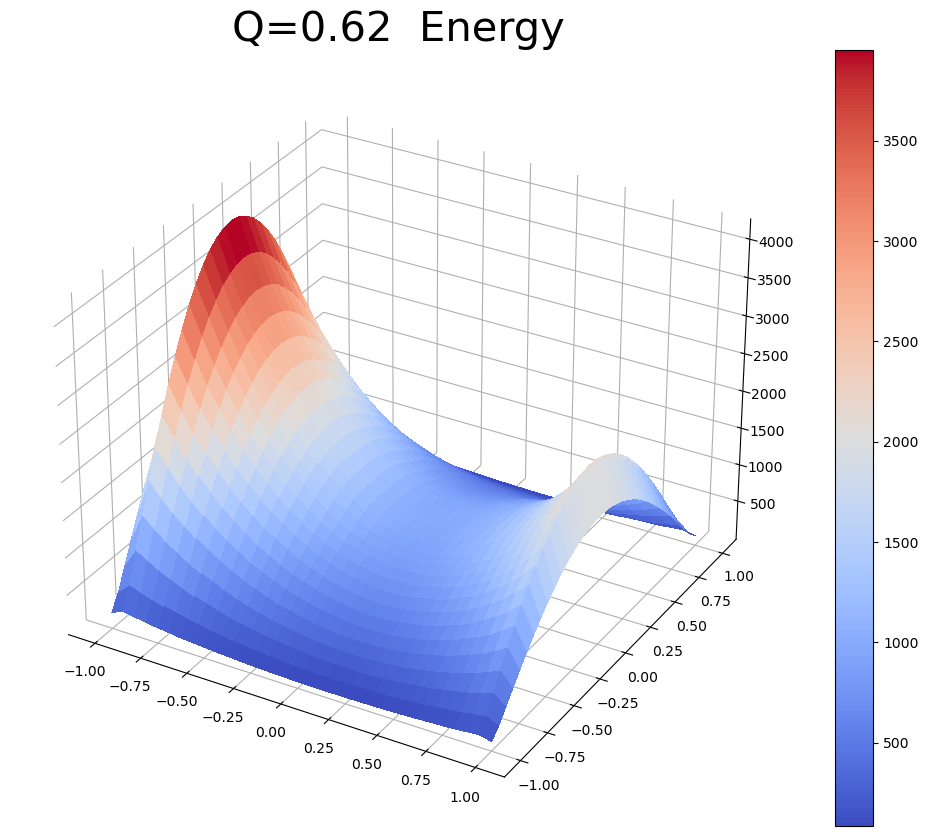

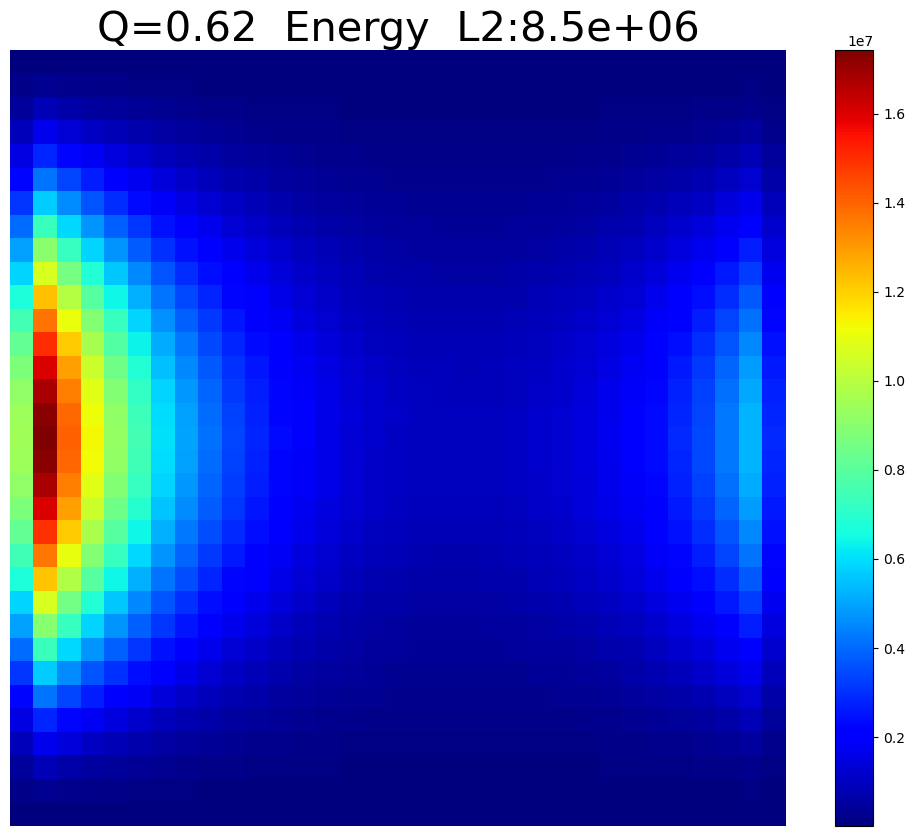

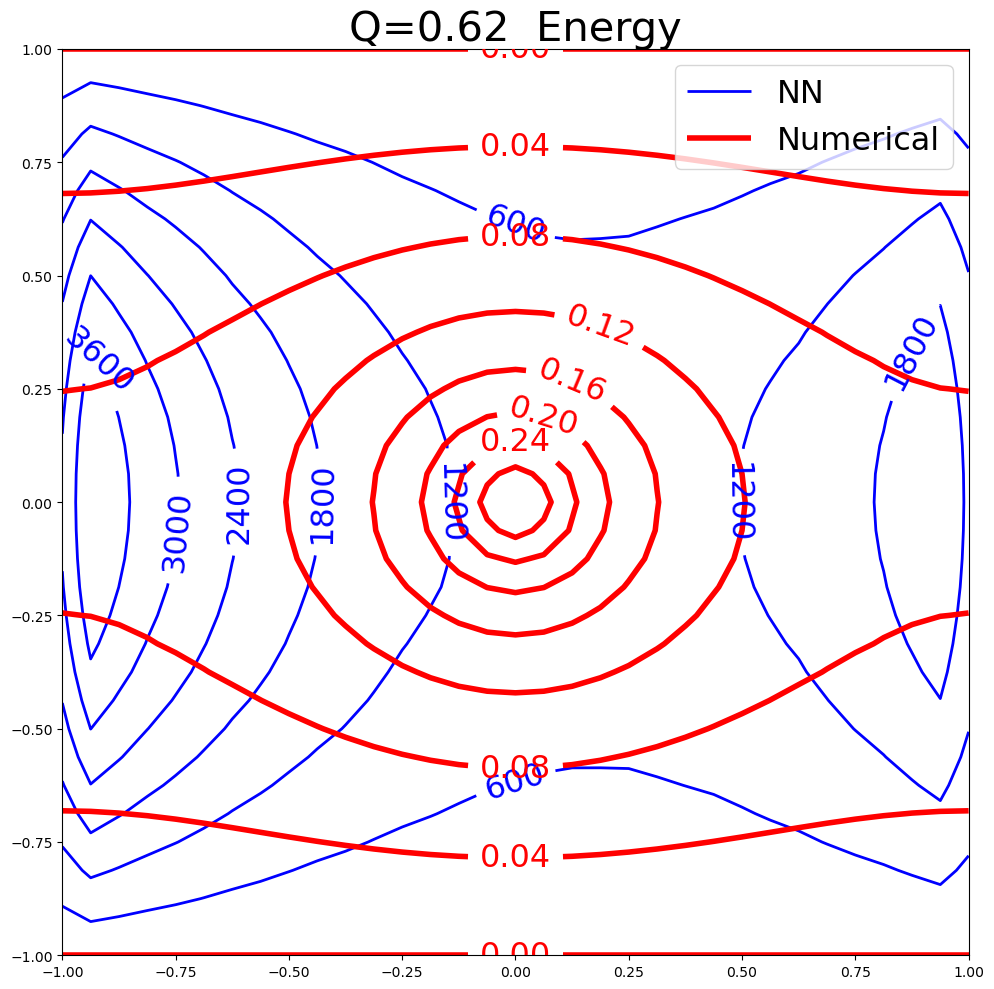

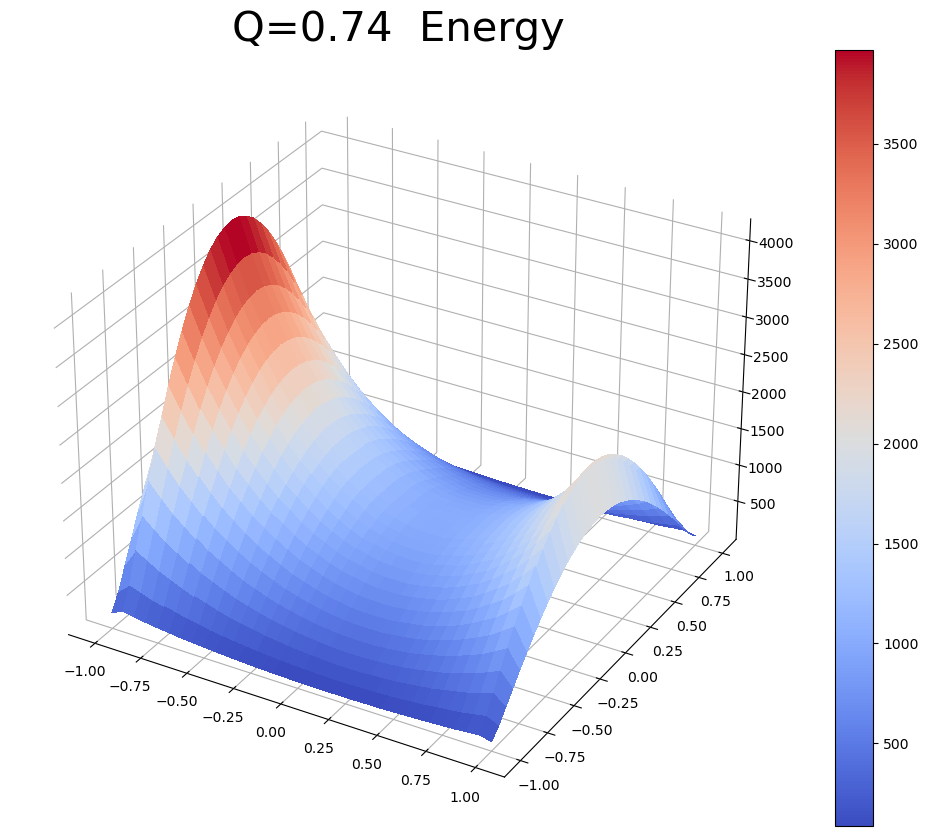

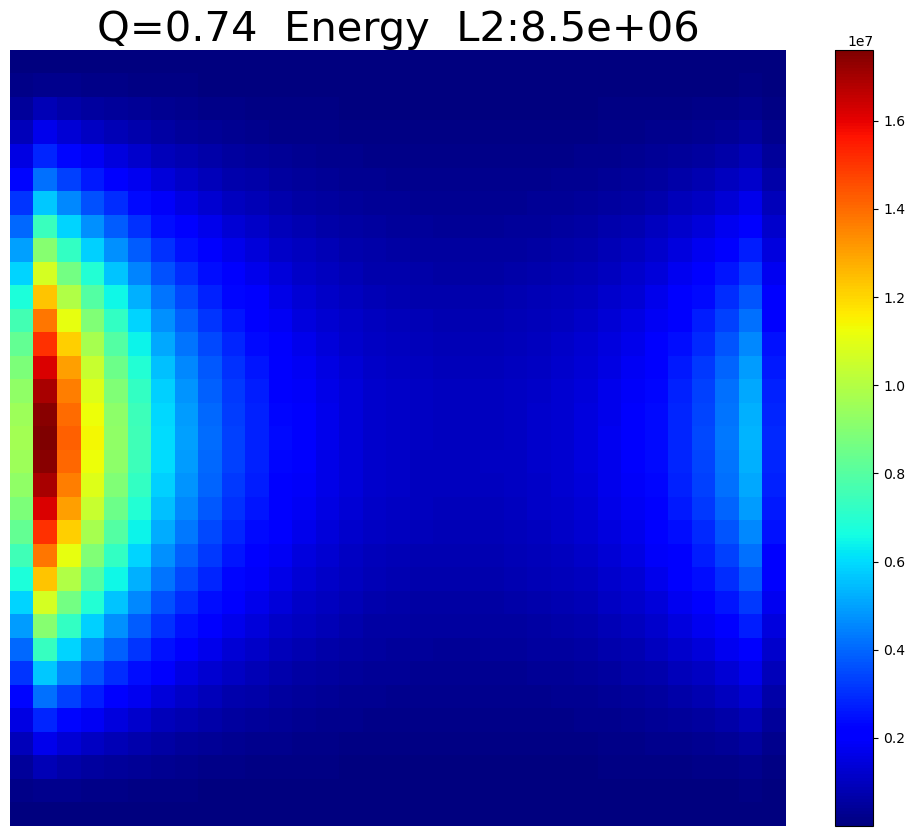

...

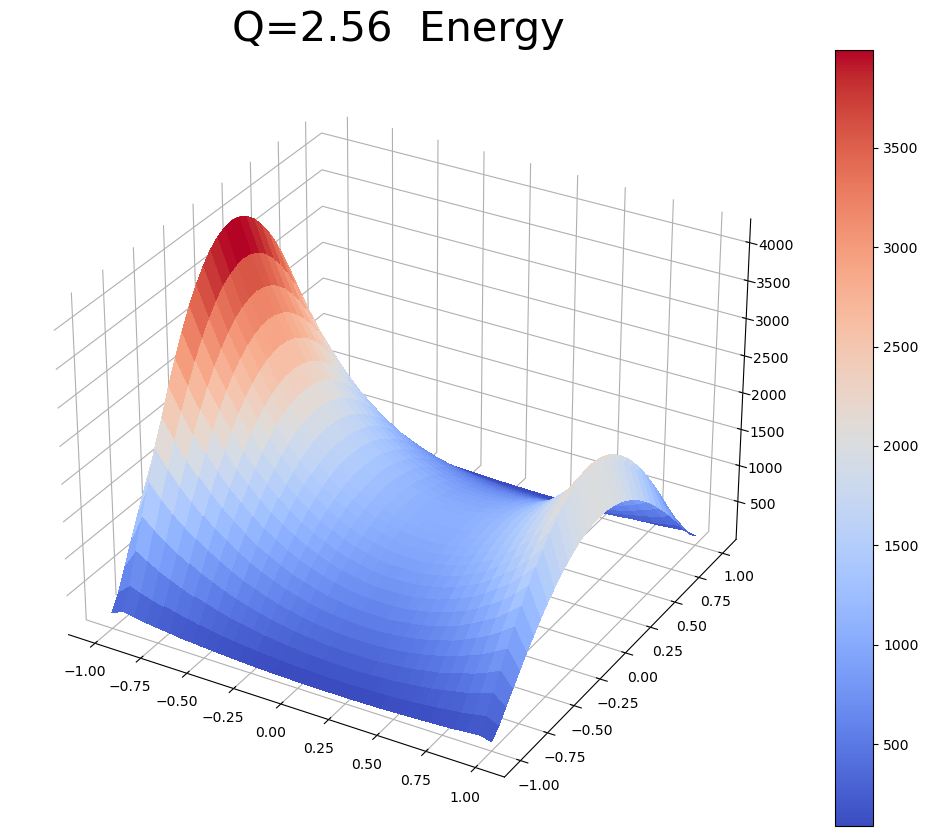

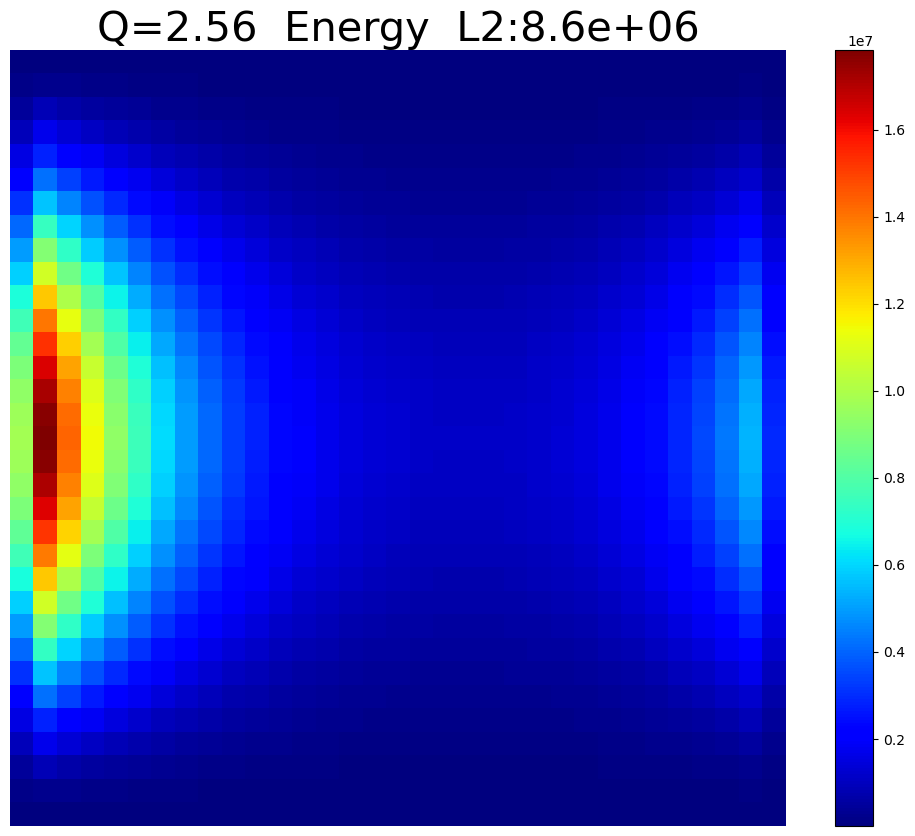

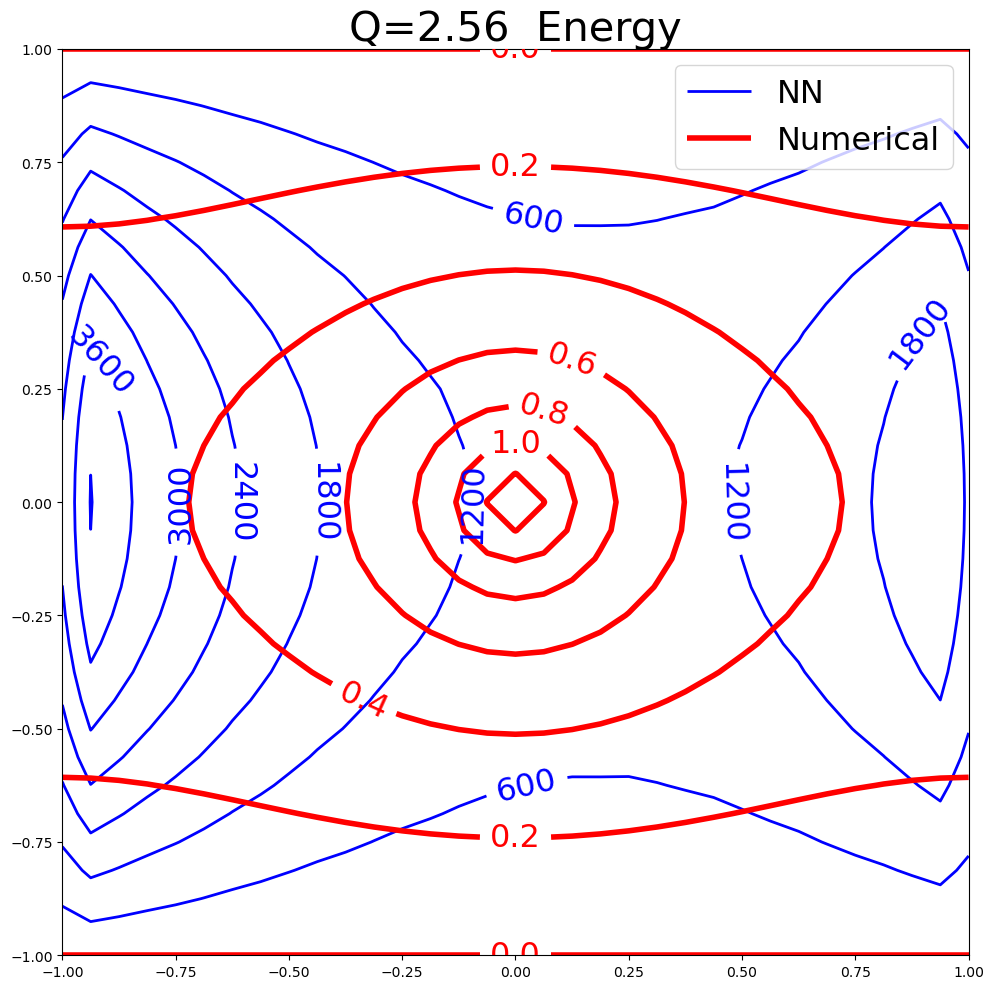

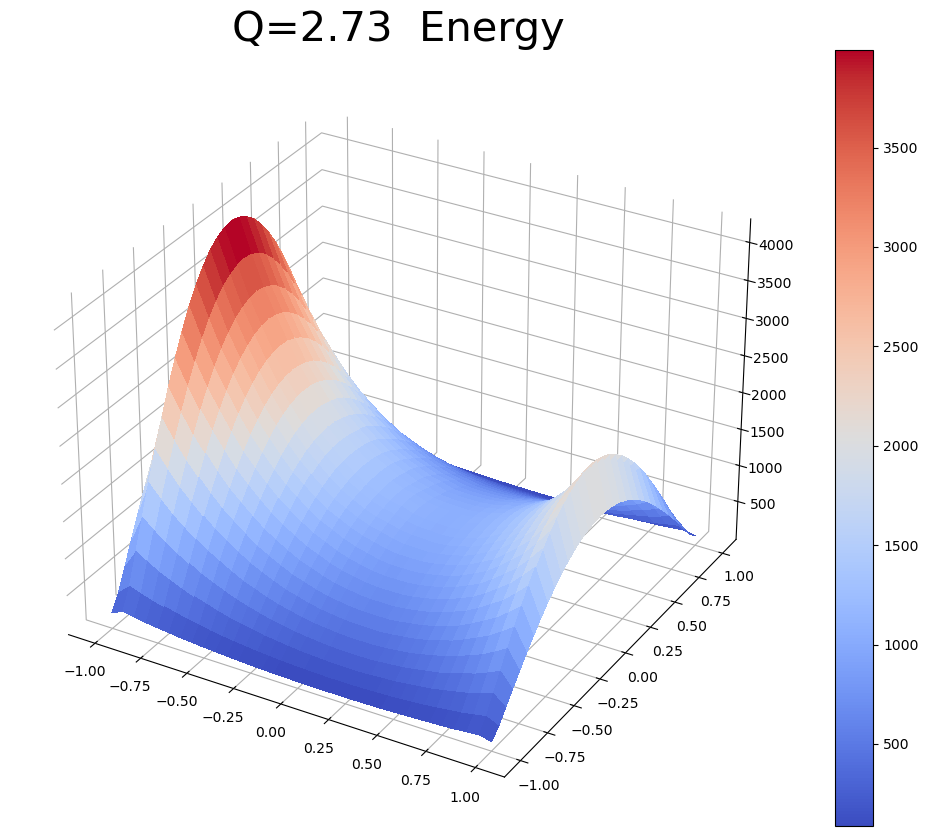

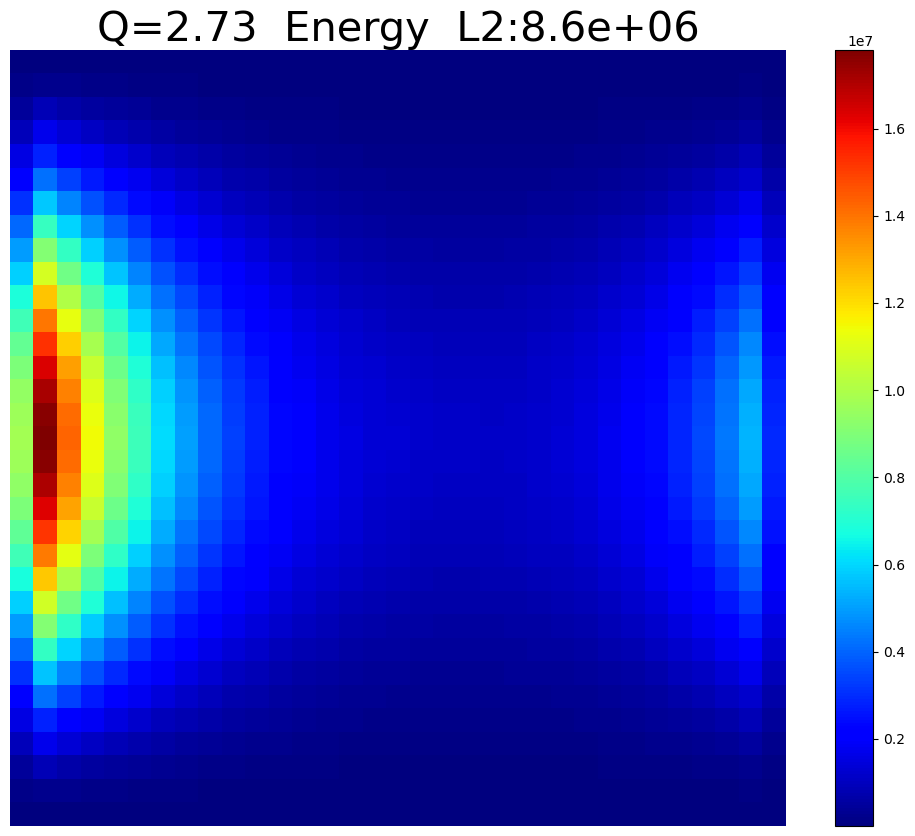

<Figure size 1000x1000 with 0 Axes>

In [154]:
def test_qs(model, ckpt_path, Qs, func, name, label, order=2, N=131, mode='F', title=''):
    
    h = 2/(N-1)
    ckpt = torch.load(ckpt_path)
    model.load_state_dict(ckpt['state_dict'])
    model.freeze()

    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    X = np.stack((xx, yy))
    mask = np.ones_like(xx)
    mask[1:-1, 1:-1] *= 0
    delta = func(xx, yy, h)
    
    im_nums = len(Qs)
    if title == '':
        A = fd_A(N).tocsr()
        xx = xx[1:-1, 1:-1]
        yy = yy[1:-1, 1:-1]
        
    elif title == 'neu':
        A = fd_A_neu(N).tocsr()
    elif title == 'bc':
        A = fd_A_with_bc(N).tocsr()
        
    for idx, Q in enumerate(Qs):
        fig1 = plt.figure()
        fig1.set_figheight(10)
        fig1.set_figwidth(10)

        fig2 = plt.figure()
        fig2.set_figheight(10)
        fig2.set_figwidth(10)

        fig3 = plt.figure()
        fig3.set_figheight(10)
        fig3.set_figwidth(10)

        ax1 = fig1.add_subplot(1, 1, 1, projection='3d')
        ax2 = fig2.add_subplot(1, 1, 1)
        ax3 = fig3.add_subplot(1, 1, 1)
        ax2.set_aspect('equal', 'box')
        ax2.set_axis_off()
        ax3.set_aspect('equal', 'box')
        
        if mode == 'F':
            data = torch.from_numpy(np.stack((*X, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
        elif mode == 'M':
            data = torch.from_numpy(np.stack((mask, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
        pre = model(data).squeeze().numpy()
        
        if title == '':
            b = fd_b(Q * delta, h)
            ans = spsolve(A, b).reshape(N-2, N-2)       
        elif title == 'neu' or title == 'bc':
            b = fd_b_bc(Q * delta, h)
            ans = spsolve(A, b).reshape(N, N)    
        
        diff = (pre - ans)**2

        surf_pre = ax1.plot_surface(xx, yy, pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)    
        ax1.set_title(f'Q={Q:.2f}  {label}', fontsize=30)
        ax1.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax1.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        ax1.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
        plt.colorbar(surf_pre, ax=ax1, shrink=0.8)
        
        im = ax2.imshow(diff, cmap='jet')   
        plt.colorbar(im, ax=ax2, shrink=0.8)
        ax2.set_title(f'Q={Q:.2f}  {label}  L2:{(diff*h**2).sum():.1e}', fontsize=30)
        ct1 = ax3.contour(xx, yy, pre, colors='b', linewidths=2,linestyles='solid')
        ct2 = ax3.contour(xx, yy, ans, colors='r', linewidths=4, linestyles='solid')    
        
        ax3.clabel(ct1, inline=True, fontsize=23)
        ax3.clabel(ct2, inline=True, fontsize=23)
        h1, _ = ct1.legend_elements()
        h2, _ = ct2.legend_elements()
        ax3.legend([h1[0], h2[0]], ['NN', 'Numerical'], prop={'size':23})
        ax3.set_title(f'Q={Q:.2f}  {label}', fontsize=30)
        
        
        fig1.tight_layout()
        fig2.tight_layout()
        fig3.tight_layout()
        
        fig1_name = f'surface_q{Q}_{name}'
        fig2_name = f'im_q{Q}_{name}'
        fig3_name = f'contour_q{Q}_{name}'
        
        fig1.savefig(f'./images/{fig1_name}.png', format='png',transparent=True)
        fig2.savefig(f'./images/{fig2_name}.png', format='png',transparent=True)
        fig3.savefig(f'./images/{fig3_name}.png', format='png',transparent=True)
        
    plt.figure().clear()
    plt.close()
    plt.cla()
    plt.clf()
    return 

model = pl_Model(net = UNet(3, 1, 16, 'neu'),
              loss = F.l1_loss,
              data_path='./data/normal33/')
# test_qs(model, 
#         ckpt_path='./lightning_logs/neu_F_33_UNet_16_bs8_jac_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=33, mode='F', name='neu_F_33_UNet_16_bs8_jac', label='Jac', title='neu')

test_qs(model, 
        ckpt_path='./lightning_logs/neu_F_33_UNet_16_bs8_energy_lr1e-03/version_0/checkpoints/last.ckpt',
        Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=33, mode='F', name='neu_F_33_UNet_16_bs8_energy', label='Energy', title='neu')

# test_qs(model, 
#         ckpt_path='./lightning_logs/neu_F_33_UNet_16_bs8_mse_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=33, mode='F', name='neu_F_33_UNet_16_bs8_mse', label='MSE', title='neu')

# model = pl_Model(net = UNet(3, 1, 16, ''),
#               loss = F.l1_loss,
#               data_path='./data/normal65/')
# # test_qs(model, 
#         ckpt_path='./lightning_logs/F_33_UNet_16_bs8_mse_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=65, mode='F', name='F_65_UNet_16_bs8_mse', label='MSE')
# test_qs(model, 
#         ckpt_path='./lightning_logs/F_129_UNet_16_bs8_jac_order2_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=129, mode='F', name='F_129_UNet_16_bs8_jac', label='Jac')
# test_qs(model, 
#         ckpt_path='./lightning_logs/F_65_UNet_16_bs8_energy_order2_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=65, mode='F', name='F_65_UNet_16_bs8_energy', label='Energy')


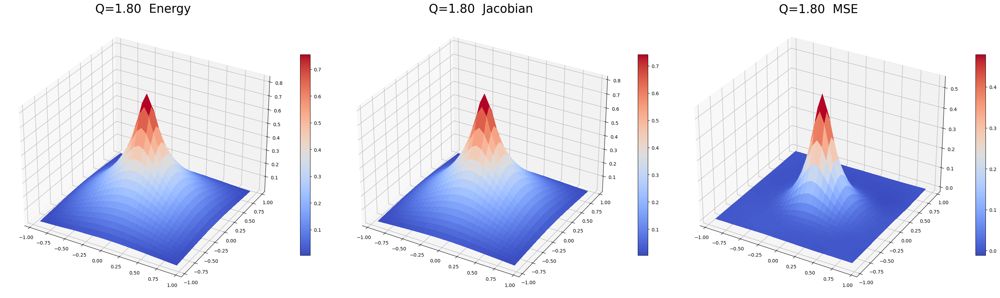

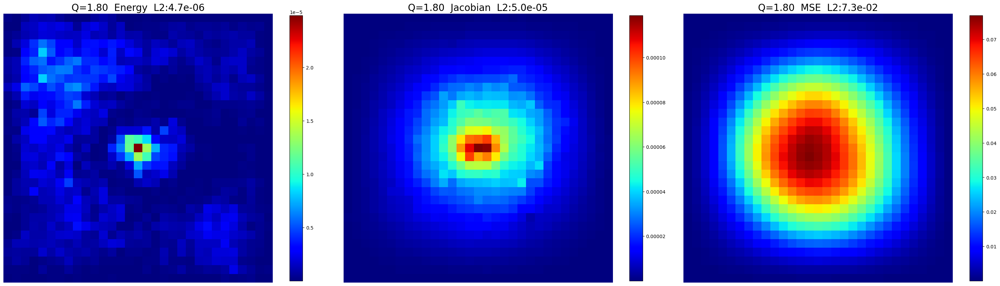

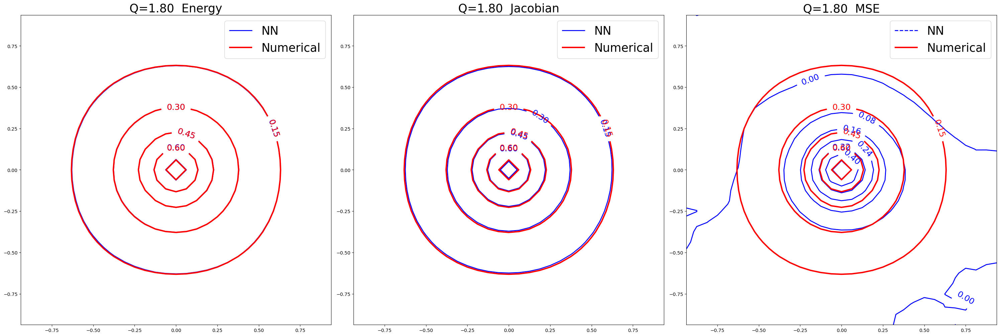

In [91]:
names = ['Energy', 'Jacobian', 'MSE']
def test_models(model, ckpt_paths, Q, func, N=131, mode='F', bc=False):
    num = len(ckpt_paths)
    h = 2/(N-1)
    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    
    mask = np.ones_like(xx)
    mask[1:-1, 1:-1] *= 0
    delta = func(xx, yy, h)

    width = num * 10
    height = 10
    
    fig1 = plt.figure()
    fig1.set_figheight(height)
    fig1.set_figwidth(width)
    
    fig2 = plt.figure()
    fig2.set_figheight(height)
    fig2.set_figwidth(width)
    
    fig3 = plt.figure()
    fig3.set_figheight(height)
    fig3.set_figwidth(width)

    if mode == 'F':
        data = torch.from_numpy(np.stack((xx, yy, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
    elif mode == 'M':
        data = torch.from_numpy(np.stack((mask, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)

    A = fd_A(N, 2).tocsr()
    b = fd_b(Q * delta, h, 2)
    ans = spsolve(A, b).reshape(N-2, N-2)
    
    for idx, ckpt_path in enumerate(ckpt_paths):
        ckpt = torch.load(ckpt_path)
        model.load_state_dict(ckpt['state_dict'])
        model.freeze()
        pre = model(data).squeeze().numpy()
        diff = (pre - ans)**2
        
        ax1 = fig1.add_subplot(1, num, idx + 1, projection='3d')
        ax2 = fig2.add_subplot(1, num, idx + 1)
        ax3 = fig3.add_subplot(1, num, idx + 1)
        
#         ax1.set_aspect('equal', 'box')
        ax2.set_aspect('equal', 'box')
        ax3.set_aspect('equal', 'box')

        if bc:
            surf_pre = ax1.plot_surface(xx, yy, pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        else:
            surf_pre = ax1.plot_surface(xx[1:-1, 1:-1], yy[1:-1, 1:-1], pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
            
        ax1.set_title(f'Q={Q:.2f}  {names[idx]}', fontsize=25)
        plt.colorbar(surf_pre, ax=ax1, shrink=0.6)
        
        im = ax2.imshow(diff, cmap='jet')   
#         ct = ax2.contourf(xx[1:-1, 1:-1], yy[1:-1, 1:-1], diff, cmap='jet')
        plt.colorbar(im, ax=ax2, shrink=0.8)
        ax2.set_title(f'Q={Q:.2f}  {names[idx]}  L2:{(diff*h**2).sum():.1e}', fontsize=20)
        ax2.set_axis_off()
        if bc:
            ct1 = ax3.contour(xx, yy, pre, colors='b', linewidths=2)
            ct2 = ax3.contour(xx, yy, ans, colors='r', linewidths=3, linestyles='solid',)
        else:
            ct1 = ax3.contour(xx[1:-1, 1:-1], yy[1:-1, 1:-1], pre, colors='b', linewidths=2)
            ct2 = ax3.contour(xx[1:-1, 1:-1], yy[1:-1, 1:-1], ans, colors='r', linewidths=3, linestyles='solid',)
        ax3.set_title(f'Q={Q:.2f}  {names[idx]}', fontsize=35)
        ax3.clabel(ct1, inline=True, fontsize=18)
        ax3.clabel(ct2, inline=True, fontsize=18)
        h1, _ = ct1.legend_elements()
        h2, _ = ct2.legend_elements()
        ax3.legend([h1[0], h2[0]], ['NN', 'Numerical'], prop={'size':25})
        
    fig1.tight_layout()
    fig2.tight_layout()
    fig3.tight_layout()
    
model = pl_Model(net = UNet(3, 1, 16, False),
              loss = F.l1_loss,
              data_path='./data/normal33/')
test_models(model, 
            ckpt_paths=[
                './lightning_logs/F_33_UNet_16_bs8_energy_order2_lr1e-03/version_0/checkpoints/last.ckpt',
                './lightning_logs/F_33_UNet_16_bs8_jac_order2_lr1e-03/version_0/checkpoints/last.ckpt',
                './lightning_logs/F_33_UNet_16_bs8_mse_lr1e-03/version_0/checkpoints/last.ckpt'
            ],            Q=1.8, func=normal, N=33, mode='F')

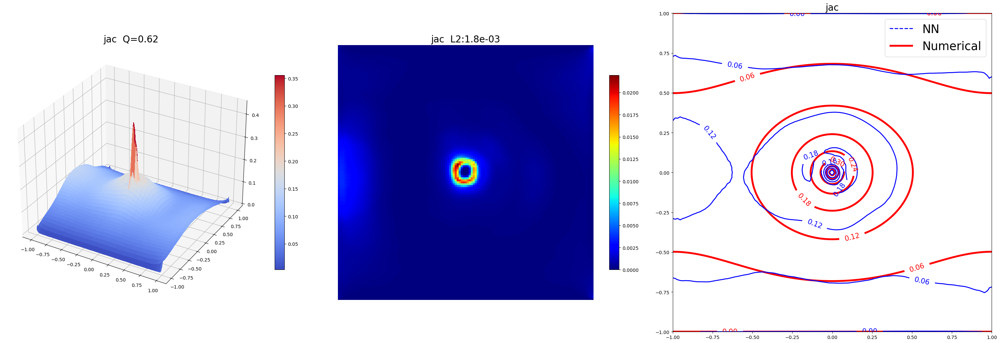

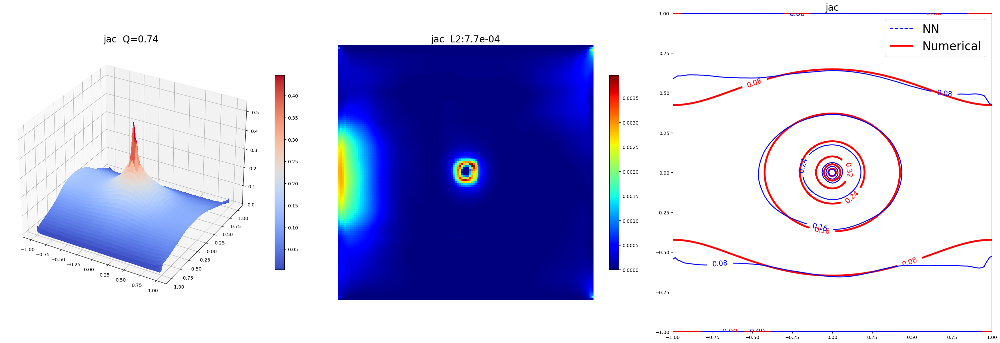

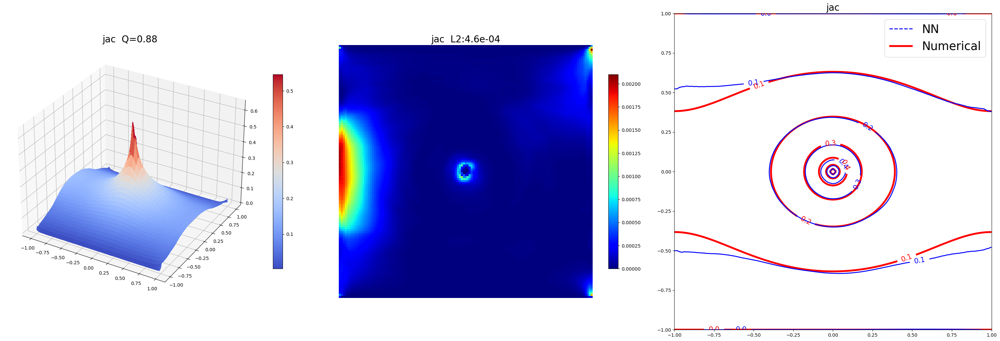

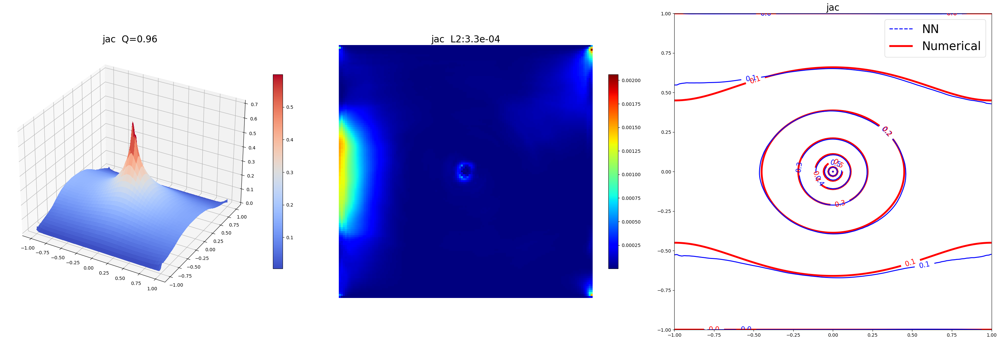

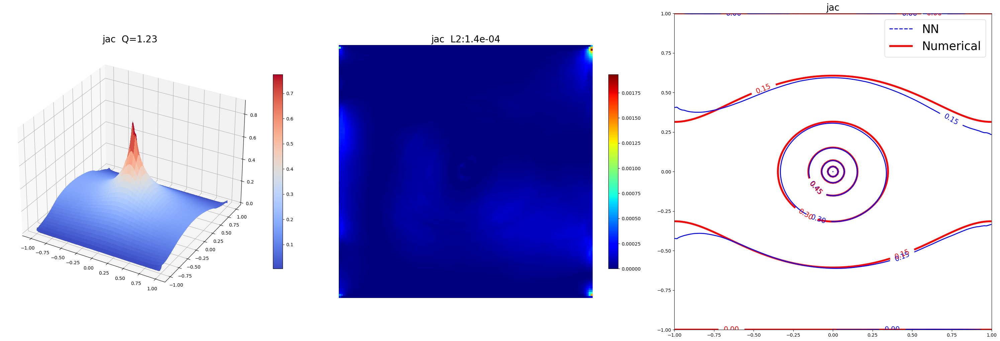

...

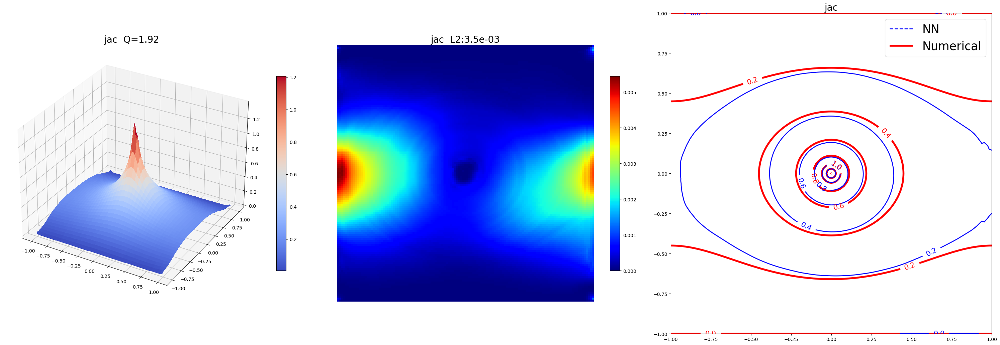

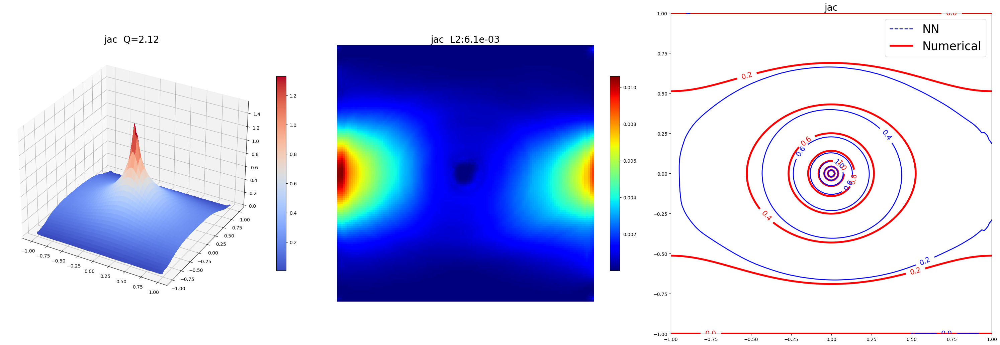

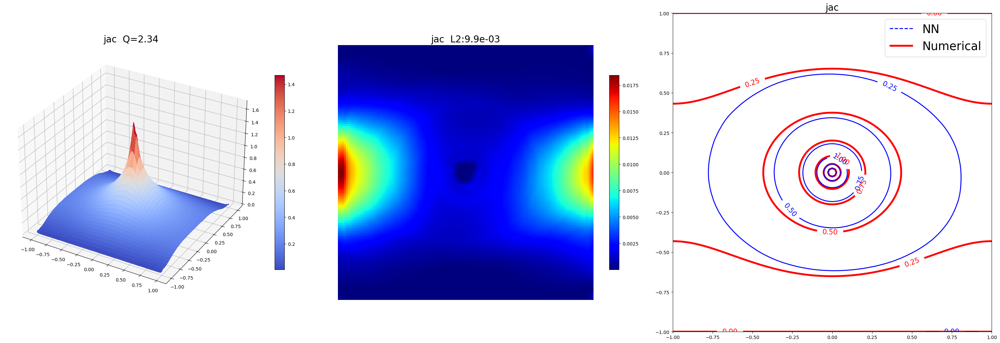

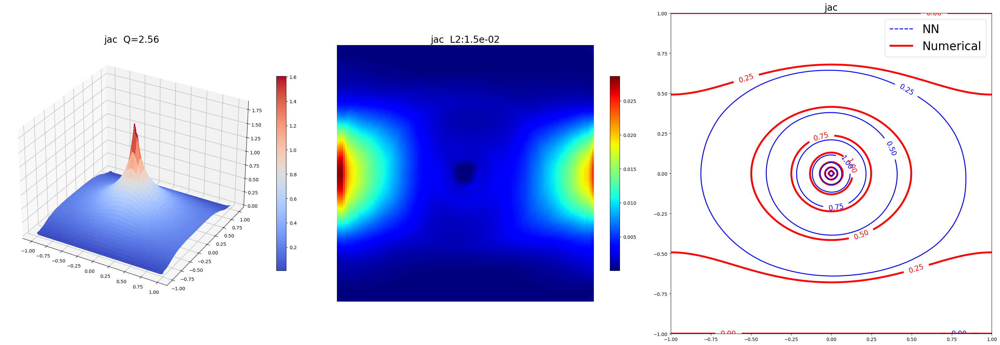

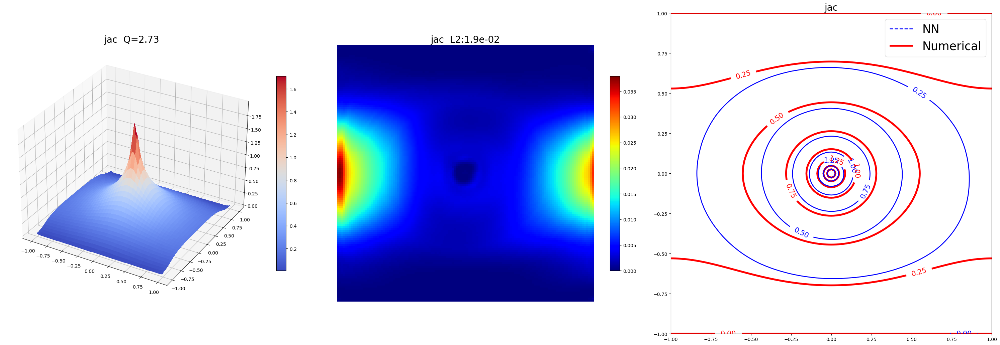

In [169]:
def test_neu_qs(model, ckpt_path, Qs, func, label, order=2, N=131, mode='F', bc=True):
    
    h = 2/(N-1)
    ckpt = torch.load(ckpt_path)
    model.load_state_dict(ckpt['state_dict'])
    model.freeze()

    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    
    mask = np.ones_like(xx)
    mask[1:-1, 1:-1] *= 0
    delta = func(xx, yy, h)
    
    im_nums = len(Qs)
    
    for idx, Q in enumerate(Qs):
        fig = plt.figure()
        fig.set_figheight(10)
        fig.set_figwidth(30)

        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)
        ax2.set_aspect('equal', 'box')
        ax2.set_axis_off()
        ax3.set_aspect('equal', 'box')
        if mode == 'F':
            data = torch.from_numpy(np.stack((xx, yy, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
            pre = model(data).squeeze().numpy()
    
        elif mode == 'M':
            data = torch.from_numpy(np.stack((mask, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
            pre = model(data).squeeze().numpy()
        
        A = fd_A_neu(N).tocsr()
        b = fd_b_bc(Q * delta, h, order)
        ans = spsolve(A, b).reshape(N, N)
#         ans = ans[1:-1, 1:-1]
        
        diff = (pre - ans)**2

        surf_pre = ax1.plot_surface(xx, yy, pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        ax1.set_title(f'{label}  Q={Q:.2f}', fontsize=20)
        plt.colorbar(surf_pre, ax=ax1, shrink=0.6)
        
        im = ax2.imshow(diff, cmap='jet')   
        plt.colorbar(im, ax=ax2, shrink=0.6)
        ax2.set_title(f'{label}  L2:{(diff*h**2).sum():.1e}', fontsize=20)
        
        ct2 = ax3.contour(xx, yy, ans, colors='r', linewidths=4)
        ct1 = ax3.contour(xx, yy, pre, colors='b', linewidths=2)
        
        ax3.clabel(ct1, inline=True, fontsize=15)
        ax3.clabel(ct2, inline=True, fontsize=15)
        h1, _ = ct1.legend_elements()
        h2, _ = ct2.legend_elements()
        ax3.legend([h1[0], h2[0]], ['NN', 'Numerical'], prop={'size':25})
        ax3.set_title(f'{label}', fontsize=20)
        
        fig.tight_layout()
    return 
    
model = pl_Model(net = UNet(3, 1, 16, 'neu'),
              loss = F.l1_loss,
              data_path='./data/normal33/')
# test_neu_qs(model, 
#         ckpt_path='./lightning_logs/neu_F_33_UNet_16_bs8_energy_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=33, mode='F', label='energy')
test_neu_qs(model, 
        ckpt_path='./lightning_logs/neu_F_129_UNet_16_bs8_jac_lr1e-03/version_0/checkpoints/last.ckpt',
        Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=129, mode='F', label='jac')
# test_neu_qs(model, 
#         ckpt_path='./lightning_logs/neu_F_33_UNet_32_bs8_mse_lr1e-03/version_0/checkpoints/last.ckpt',
#         Qs=[0.62, 0.74, 0.88, 0.96, 1.23, 1.45, 1.67, 1.92, 2.12, 2.34, 2.56, 2.73], func=normal, order=2, N=33, mode='F', label='mse')

In [ ]:
def test_with_fine_result(model, ckpt_path, test_data_path, func, order=2, N=131, mode='F'):
    
    p = Path(test_data_path)
    
    
    h = 2/(N-1)
    ckpt = torch.load(ckpt_path)
    model.load_state_dict(ckpt['state_dict'])
    model.freeze()

    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    xx, yy = np.meshgrid(x, y)
    
    mask = np.ones_like(xx)
    mask[1:-1, 1:-1] *= 0
    delta = func(xx, yy, h)
    
    for fine_u in p.iterdir():
        Q = float(fine_u.name[:4])
        ans = np.load(fine_u)
        n = int(np.sqrt(ans.shape))
        xg, yg = np.linspace(-1, 1, n), np.linspace(-1, 1, n)
        X, Y = np.meshgrid(xg, yg)
#         func_cu = RegularGridInterpolator((xg, yg), ans.reshape(n, n))
#         ans = func_cu((xx, yy)).reshape(N, N)[1:-1, 1:-1]
        
        if mode == 'F':
            data = torch.from_numpy(np.stack((xx, yy, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
            pre = model(data).squeeze().numpy()
    
        elif mode == 'M':
            data = torch.from_numpy(np.stack((mask, Q * delta))[np.newaxis, ...]).to(dtype=torch.float32)
            pre = model(data).squeeze().numpy()
     
        fig = plt.figure()
        fig.set_figheight(10)
        fig.set_figwidth(30)

#         diff = (pre - ans)**2
        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
#         ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)

        surf_pre = ax1.plot_surface(xx[1:-1, 1:-1], yy[1:-1, 1:-1], pre, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        ax1.set_title(f'$Pre Q={Q:.4f}$', fontsize=20)
        plt.colorbar(surf_pre, ax=ax1, shrink=0.8)
        
        
#         im = ax2.imshow(diff, cmap='jet')   
#         plt.colorbar(im, ax=ax2, shrink=0.8)
#         ax2.set_title(f'$L2 Norm:{(diff*h**2).sum():.4f}$', fontsize=20)
        
        
        ct1 = ax3.contour(xx[1:-1, 1:-1], yy[1:-1, 1:-1], pre, colors='b', linewidths=2)
        ct2 = ax3.contour(X, Y, ans.reshape(X.shape), colors='r', linewidths=3, linestyles='solid')
        ax3.clabel(ct1, inline=True, fontsize=10)
        ax3.clabel(ct2, inline=True, fontsize=10)
        h1, _ = ct1.legend_elements()
        h2, _ = ct2.legend_elements()
        ax3.legend([h1[0], h2[0]], ['NN', 'Numerical'],  fontsize='medium')
        
        fig.tight_layout()

model = pl_Model(net = UNet(3, 1, 16, False),
              loss = F.l1_loss,
              val_save_path='./valu/nouse/',
              data_path='./data/normal65/',
              lr=1e-3, order=2)
test_with_fine_result(model, ckpt_path='./lightning_logs/F_65_UNet_16_bs16_jac_order2_lr1e-03/version_0/checkpoints/epoch=62-step=7875.ckpt', 
        test_data_path='./data/test/', func=normal1, order=2, N=65, mode='F')

In [ ]:
f = lambda x,y: 8*np.pi**2*np.sin(2*np.pi*x)*np.sin(2*np.pi*y) 
u = lambda x,y: np.sin(2*np.pi*x)*np.sin(2*np.pi*y) + 1

def fd_solver_bc(f, n, a=1, order=2, g=1):
    h = 2*a/(n-1)
    A = fd_A_with_bc(n, order)
    b = fd_b_bc(f, h, order)
    b = apply_dirichlet_bc(b, True, g, order)
    return spsolve(A.tocsr(), b)

def fd_solver(f, n, a=1, order=2, g=1):
    h = 2*a/(n-1)
    A = fd_A(n, order)
    b = fd_b(f, h, order)
    b = apply_dirichlet_bc(b, False, g, order)
    return spsolve(A.tocsr(), b)

def mean_L2(pre, ans, h):
    pre = pre.flatten()
    ans = ans.flatten()
    diff = (pre - ans)**2 * h**2
    diff = np.sqrt(diff.sum())
    return diff

In [ ]:
def compute_order(f, u, hs, left=-1, right=1, bottom=-1, top=1):
    
    errors_2nd = []
    errors_4th = []
    for h in hs:
        Nx = round((right - left)/h) + 1
        Ny = round((top - bottom)/h) + 1
        x = np.linspace(left, right, Nx)
        y = np.linspace(bottom, top, Ny)
        xx, yy = np.meshgrid(x, y)
        force = f(xx, yy)
        ue = u(xx, yy)[1:-1, 1:-1].flatten()
        
        ua_2nd = fd_solver(force, Nx)
        ua_4th = fd_solver(force, Nx, order=4)
#         error_2nd = np.linalg.norm(ua_2nd-ue)
#         error_4th = np.linalg.norm(ua_4th-ue)
        error_2nd = mean_L2(ua_2nd, ue, h)
        error_4th = mean_L2(ua_4th, ue, h)
    
        errors_2nd.append(error_2nd)
        errors_4th.append(error_4th)
    
    print(f"{'mesh size':>11s} {'error_2nd':>11s} {'ratio_2nd':>11s} {'error_4th':>11s} {'ratio_4th':>11s}")
    for i, h in enumerate(hs):
        if i == 0:
            print(f"{h:>11.4e} {errors_2nd[i]:>11.3e} {' ':>11s} {errors_4th[i]:>11.3e}")
        else:
            ratio_2nd = np.log(errors_2nd[i-1]/errors_2nd[i])/np.log(hs[i-1]/hs[i])
            ratio_4th = np.log(errors_4th[i-1]/errors_4th[i])/np.log(hs[i-1]/hs[i])
#             ratio_4th = np.log(errors_4th[i-1]/errors_4th[i])
            
            print(f"{h:>11.4e} {errors_2nd[i]:>11.3e} {ratio_2nd:>11.3f} {errors_4th[i]:>11.3e} {ratio_4th:>11.3f}")
    
compute_order(f, u, [0.5, 0.2, 0.1, 0.05, 0.025, 0.0125])